In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

## 1. Import dataset 

In [2]:
military = pd.read_csv('global firepower 2022 wide.csv')

In [3]:
military.describe()

,Active Personnel,Aircraft Carriers,Armored Vehicles,Attack Helicopters,Available Manpower,Coastline Coverage,Corvettes,Dedicated Attack,Defense Budget,Destroyers,...,Square Land Area,Submarines,Tanker Fleet,Tanks,Total Aircraft Strength,Total Population,Towed Artillery,Trainers,Transports,Waterways (usable)
count,1.400000e+02,140.000000,140.000000,140.000000,1.400000e+02,140.000000,140.000000,140.000000,1.400000e+02,140.000000,...,1.400000e+02,140.000000,140.000000,140.000000,140.000000,1.400000e+02,140.000000,140.000000,140.000000,140.000000
mean,1.378579e+05,14.592857,2770.428571,25.178571,2.578443e+07,4820.778571,2.985714,25.950000,1.447492e+10,1.707143,...,9.419542e+05,3.657143,5.785714,663.264286,378.757143,5.435363e+07,381.692857,81.807143,30.492857,4641.071429
std,2.790035e+05,170.880239,5907.143029,93.304658,8.478686e+07,18474.920517,10.005024,97.011408,6.968119e+10,9.174171,...,2.212054e+06,11.368119,53.002075,1541.585928,1222.932158,1.677120e+08,872.426203,241.470611,96.240294,14065.557303
min,0.000000e+00,0.000000,20.000000,0.000000,1.450000e+02,0.000000,0.000000,0.000000,1.180000e+07,0.000000,...,6.970000e+02,0.000000,0.000000,0.000000,0.000000,6.074140e+05,0.000000,0.000000,0.000000,0.000000
25%,1.475000e+04,0.000000,246.750000,0.000000,2.546108e+06,44.500000,0.000000,0.000000,3.611000e+08,0.000000,...,8.380325e+04,0.000000,0.000000,18.000000,30.750000,5.585554e+06,15.000000,4.000000,2.750000,0.000000
50%,4.000000e+04,0.000000,712.500000,2.000000,6.100049e+06,793.000000,0.000000,0.000000,1.765000e+09,0.000000,...,3.006700e+05,0.000000,0.000000,145.500000,106.000000,1.596157e+07,86.500000,26.000000,8.500000,800.000000
75%,1.312500e+05,0.000000,2625.250000,18.500000,1.768414e+07,2675.500000,2.000000,18.000000,6.047400e+09,0.000000,...,7.866952e+05,2.000000,0.000000,407.000000,282.500000,4.063178e+07,326.500000,73.250000,22.000000,2825.000000
max,2.000000e+06,2022.000000,45193.000000,910.000000,7.548648e+08,202080.000000,86.000000,783.000000,7.700000e+11,92.000000,...,1.709824e+07,79.000000,627.000000,12420.000000,13247.000000,1.397898e+09,7571.000000,2661.000000,982.000000,110000.000000


## 2. Exploratory Data Analysis

### 2.1 Data Types: 

In [4]:
Dtype_count = pd.DataFrame(military.dtypes.value_counts())
Dtype_count['type'] = Dtype_count.index
Dtype_count['Count'] = Dtype_count[0]
Dtype_count = Dtype_count.reset_index()
Dtype_count = Dtype_count.drop(columns=["index"])
Dtype_count = Dtype_count.iloc[:,1:]

Dtype_count = Dtype_count.astype({'type':str})
Dtype_count = Dtype_count.astype({'Count':int})

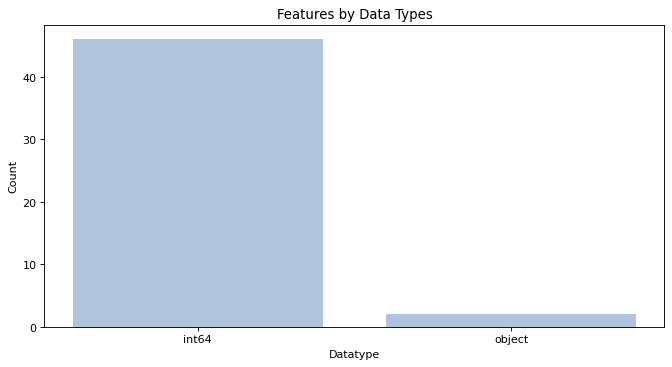

In [5]:
plt.figure(figsize=(10, 5), dpi=80)
data = Dtype_count.Count
plt.title('Features by Data Types')
plt.xlabel("Datatype")
plt.ylabel("Count")
plt.bar(Dtype_count.type, data,color='lightsteelblue')
plt.show()

### 2.2 Check missing value

In [6]:
military.isnull().sum().sum()

0

### 2.3 Correlation of Numeric Features

In [7]:
Num_data = military.drop(columns=['country','country_code'])

<AxesSubplot:>

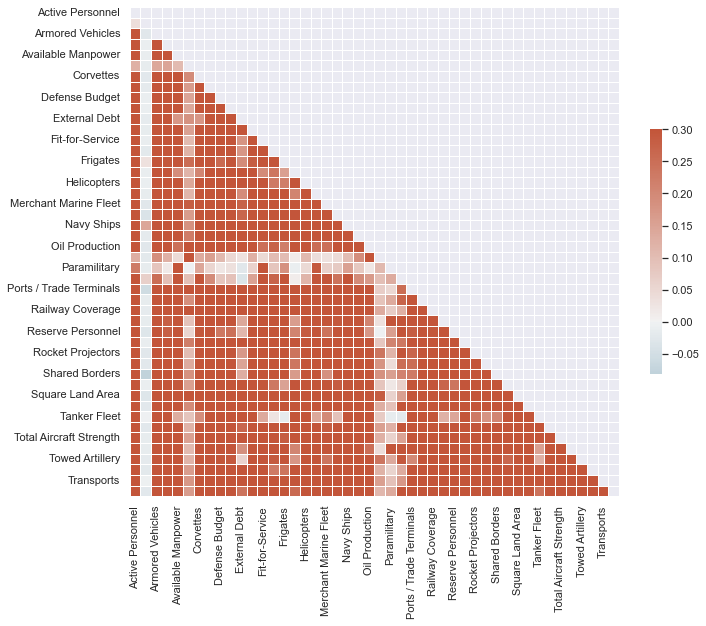

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="white")

# Generate a large random dataset
rs = np.random.RandomState(265)
d = Num_data

sns.set(rc = {'figure.figsize':(20,10)})

# Compute the correlation matrix
corr = d.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
#annot = True, annot_kws = {"size": 5}

## 3. Data Cleaning, Prepocessing, Feature Engineering 

### 3.1 Normalizing Data

In [9]:
#Normalize the dataset:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

num_cols = military.select_dtypes(np.number).columns.values.tolist()
military[num_cols] = scaler.fit_transform(military[num_cols])

### 3.2 Data Cleaning

Remove Outliers

In [10]:
military_origin = military.copy()

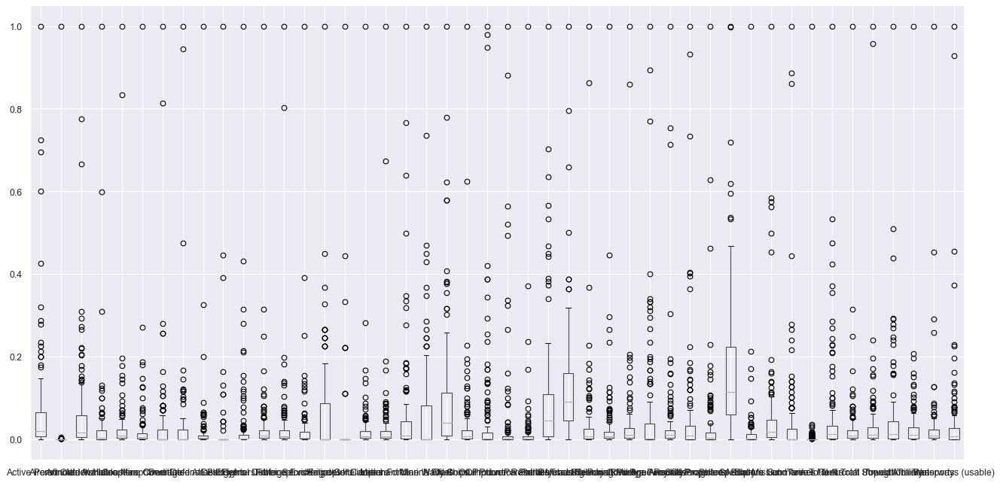

In [11]:
plt.figure(figsize=(20, 10), dpi=80)
military.boxplot()
plt.show()

In [12]:
def remove_outlier(col):
    Q1,Q3 = col.quantile([0.25,0.75])
    IQR = Q3-Q1
    lower_range = Q1-(1.5 * IQR)
    upper_range = Q3+(1.5 * IQR)
    return lower_range, upper_range

In [13]:
for col in military.loc[:,(military.dtypes=='float64')]:
    low,upper = remove_outlier(military[col])
    military[col] = np.where(military[col]>upper,upper,military[col])
    military[col] = np.where(military[col]<low,low,military[col])

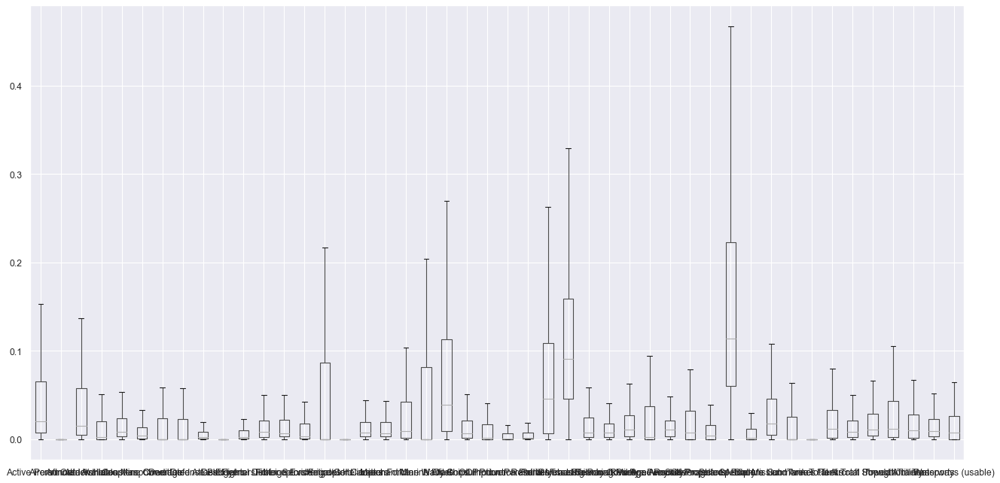

In [14]:
plt.figure(figsize=(20, 10), dpi=80)
military.boxplot()
plt.show()

### Distribution of Numeric Features

We put distribution of numeric features here because it looks better after removing outliers and doing normalization.

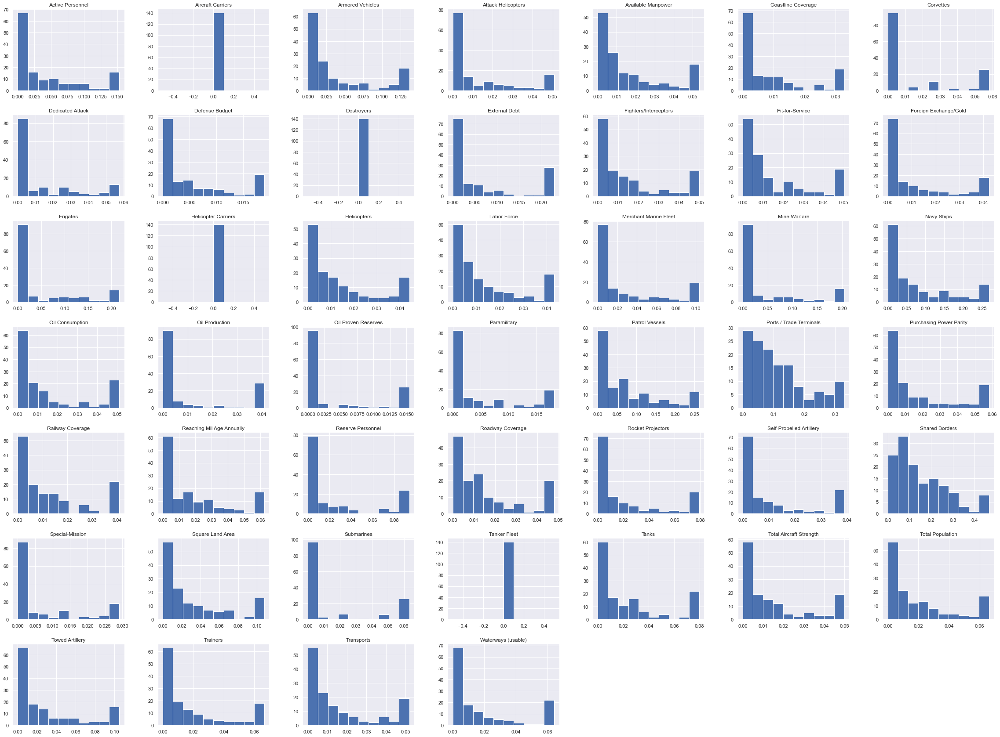

In [15]:
military.hist(figsize=(40,30))
plt.show()

### 3.3 Feature Engineering

In [17]:
# Drop the country_code:
military = military.drop(columns=['country_code'])

## 4. K-Means model

Implement kmeans code from scratch:

In [18]:
from scipy.spatial.distance import pdist,squareform,cdist

In [19]:
def init_centroid(df,k):
    
    #Randome the first centroid index:
    first_index = random.randrange(0,len(df),1)
    print('The first index of the centroid is', first_index)
    first_centroid = df.loc[first_index]
    
    #Insert the index of the first centroid into the centroids list:
    centroids = [first_index]
    
    #Calculate the distance:
    # pdist: calculate the pairwise distances btwn observations in n-dimensional space.
    # squareform is to convert the vector form distance vector to a distance matrix.
    dist = squareform(pdist(df)) #default: euclidean distance
    
    for i in range(k-1):
        Dx = np.zeros(len(df))
        for j in range(len(df)):
            Dx[j] = min(dist[j,k] for k in centroids)
        
        
        choice = random.choices(range(len(df)),weights=Dx**2)[0] #random.choices output is a lit
        centroids.append(choice)
    
    
    
    return centroids #return a list of indexes of centroids

In [20]:
def kmeanspp(df,k):
    random.seed(265) 
    
    centroids_index = init_centroid(df,k)
    
    #insert the index of the first centroid into the centroids list
    centroids = df.loc[centroids_index,:] #k rows, 46 columns
    
    #calcualte distance from each data point of df to the first centroid by using cdist. 
    distance = cdist(df,centroids,'euclidean')
    #Find the min distance and make them as an array named labels.
    labels = np.array([np.argmin(i) for i in distance])
    old_labels = np.zeros(len(df),dtype = int)
    
    #For each element in the the label and old_label list, if they are equal,continue this while loop. Otherwise, stop
    while (labels != old_labels).any(): 
        
        #print(dist)
        old_labels = labels
        
        centroids = []
        
        for i in range(k):
            #Updating centroids location by taking the average of the points in each cluster group
            temp = df[labels==i].mean() 
            centroids.append(temp)
        
        #update centroids: 
        centroids = np.vstack(centroids) 
        
        #update the distances for each centroid each time
        distances = cdist(df, centroids ,'euclidean')
        #Update the labels for data points that are close to the centroid
        labels = np.array([np.argmin(j) for j in distances])
    
    return labels 
    

In [21]:
military_k = military.copy()

Use elbow method to choose number of clusters:

In [22]:
from sklearn.cluster import KMeans
wcss = []
for i in range(1,10):
    kmeans = KMeans(n_clusters=i,random_state=265)
    kmeans.fit(military_k.drop(columns=['country']))
    wcss.append(kmeans.inertia_)

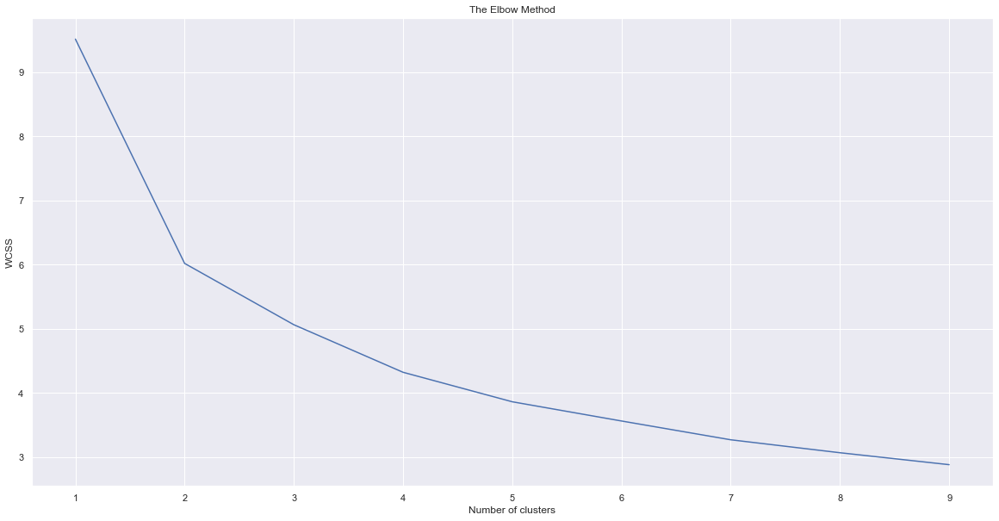

In [23]:
import matplotlib.pyplot as plt
plt.plot(range(1,10),wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.savefig('elbow.png')
plt.show()

Fit in the kmeans method: we use 4 clusters

In [24]:
import random
random.seed(265)
kmeans_labels = kmeanspp(military_k.drop(columns=['country']),k=4)
military_k['kmeans_label'] = kmeans_labels

The first index of the centroid is 100


In [25]:
#Centroids:
init_centroid(military_k.drop(columns=['country','kmeans_label']),k=4)

The first index of the centroid is 80


[80, 30, 33, 26]

Use PCA to change data into 2 dimenional data:

In [26]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2,random_state=265)
principalComponents = pca.fit_transform(military_k.drop(columns=['country','kmeans_label']))

principalDf = pd.DataFrame(data=principalComponents, columns=['principal component 1', 'principal component 2'])
principalDf

,principal component 1,principal component 2
0,-0.120528,0.156760
1,-0.151558,-0.081429
2,0.278360,0.093644
3,0.028315,0.097328
4,0.117938,0.312383
...,...,...
135,0.033141,0.091536
136,0.270274,-0.031383
137,-0.103048,-0.051628
138,-0.125167,0.161585


In [27]:
military_k['pca_dim_1'] = principalDf['principal component 1']
military_k['pca_dim_2'] = principalDf['principal component 2']

In [28]:
import matplotlib as mpl
import seaborn as sns

mpl.rcParams['figure.dpi'] = 600
plt.rcParams['figure.figsize'] = (30.0, 20.0)
plt.rcParams['font.family'] = "serif"
plt.rcParams['font.size'] = 10

df = military_k
pal = sns.color_palette("Paired")[:len(set(df['kmeans_label']))]
p1 = sns.scatterplot(x="pca_dim_1", y='pca_dim_2', hue='kmeans_label', palette = pal, data=df, s=250, alpha=0.7, legend=False)

#For each point, we add a text inside the bubble
for line in range(0,df.shape[0]):
     p1.text(df.pca_dim_1[line], df.pca_dim_2[line], df.country[line], horizontalalignment='left', size='medium', color='black', weight='semibold')

plt.suptitle('Two-Dimensional Map of Countries (PCA)', fontsize=36)
plt.xlabel('PCA - Dimension 1', fontsize=24)
plt.ylabel('PCA - Dimension 2', fontsize=24)

from scipy import interpolate
from scipy.spatial import ConvexHull

for i in df.kmeans_label.unique():
    # get the convex hull
    points = df[df.kmeans_label == i][['pca_dim_1', 'pca_dim_2']].values
    hull = ConvexHull(points)
    x_hull = np.append(points[hull.vertices,0],
                       points[hull.vertices,0][0])
    y_hull = np.append(points[hull.vertices,1],
                       points[hull.vertices,1][0])
    
    # interpolate
    dist = np.sqrt((x_hull[:-1] - x_hull[1:])**2 + (y_hull[:-1] - y_hull[1:])**2)
    dist_along = np.concatenate(([0], dist.cumsum()))
    spline, u = interpolate.splprep([x_hull, y_hull], 
                                    u=dist_along, s=0)
    interp_d = np.linspace(dist_along[0], dist_along[-1], 50)
    interp_x, interp_y = interpolate.splev(interp_d, spline)
    # plot shape
    plt.fill(interp_x, interp_y, '--', c=pal[i], alpha=0.2)
    

plt.grid()
plt.show()

K-means Groups:

In [56]:
military_k[military_k['kmeans_label']==0]['country'].head(10)

3         Angola
8     Azerbaijan
9        Bahrain
10    Bangladesh
12       Belgium
18      Bulgaria
29          Cuba
32       Denmark
40       Finland
48      Honduras
Name: country, dtype: object

In [57]:
military_k[military_k['kmeans_label']==1]['country'].head(10)

6        Australia
35           Egypt
41          France
44         Germany
46          Greece
51       Indonesia
56           Italy
58           Japan
89     North Korea
112    South Korea
Name: country, dtype: object

In [58]:
military_k[military_k['kmeans_label']==2]['country'].head(10)

2                              Algeria
4                            Argentina
14                             Bolivia
17                              Brazil
22                              Canada
25                               Chile
26                               China
27                            Colombia
31    Democratic Republic of the Congo
50                               India
Name: country, dtype: object

In [33]:
military_k[military_k['kmeans_label']==3]['country'].head(10)

0                Afghanistan
1                    Albania
5                    Armenia
7                    Austria
11                   Belarus
13                    Bhutan
15    Bosnia and Herzegovina
16                  Botswana
19              Burkina Faso
20                  Cambodia
Name: country, dtype: object

## 5. GMM model: 

In [34]:
from sklearn.mixture import GaussianMixture

In [35]:
random.seed(265)
gmm = GaussianMixture(n_components=4,random_state=265)
gmm.fit(military.drop(columns=['country']))
probs = gmm.predict_proba(military.drop(columns=['country']))
gmm_labels = probs.argmax(axis=1)

In [36]:
from sklearn.manifold import TSNE
pca = PCA(n_components=2)
tsne = TSNE(n_components=2, init="pca")

In [37]:
x_pca = pca.fit_transform(military.drop(columns=['country']))
x_tsne = tsne.fit_transform(military.drop(columns=['country']))

PCA:

In [38]:
pcaDf = pd.DataFrame(data=x_pca, columns=['principal component 1', 'principal component 2'])

In [39]:
military_pca = military.copy()

In [40]:
military_pca['pca_dim_1'] = pcaDf['principal component 1']
military_pca['pca_dim_2'] = pcaDf['principal component 2']
military_pca['gmm_labels'] = gmm_labels

In [41]:
df = military_pca
pal = sns.color_palette("Paired")[:len(set(df['gmm_labels']))]
p1 = sns.scatterplot(x="pca_dim_1", y='pca_dim_2', hue='gmm_labels', palette = pal, data=df, s=250, alpha=0.7, legend=False)

#For each point, we add a text inside the bubble
for line in range(0,df.shape[0]):
     p1.text(df.pca_dim_1[line], df.pca_dim_2[line], df.country[line], horizontalalignment='left', size='medium', color='black', weight='semibold')

plt.suptitle('Two-Dimensional Map of Countries (PCA)', fontsize=36)
plt.xlabel('PCA - Dimension 1', fontsize=24)
plt.ylabel('PCA - Dimension 2', fontsize=24)

from scipy import interpolate
from scipy.spatial import ConvexHull

for i in df.gmm_labels.unique():
    # get the convex hull
    points = df[df.gmm_labels == i][['pca_dim_1', 'pca_dim_2']].values
    hull = ConvexHull(points)
    x_hull = np.append(points[hull.vertices,0],
                       points[hull.vertices,0][0])
    y_hull = np.append(points[hull.vertices,1],
                       points[hull.vertices,1][0])
    
    # interpolate
    dist = np.sqrt((x_hull[:-1] - x_hull[1:])**2 + (y_hull[:-1] - y_hull[1:])**2)
    dist_along = np.concatenate(([0], dist.cumsum()))
    spline, u = interpolate.splprep([x_hull, y_hull], 
                                    u=dist_along, s=0)
    interp_d = np.linspace(dist_along[0], dist_along[-1], 50)
    interp_x, interp_y = interpolate.splev(interp_d, spline)
    # plot shape
    plt.fill(interp_x, interp_y, '--', c=pal[i], alpha=0.2)
    

plt.grid()
plt.show()

TSNE:

In [42]:
tsneDf = pd.DataFrame(data=x_tsne, columns=['principal component 1', 'principal component 2'])

In [43]:
military_tsne = military.copy()

In [44]:
military_tsne['tsne_dim_1'] = tsneDf['principal component 1']
military_tsne['tsne_dim_2'] = tsneDf['principal component 2']
military_tsne['gmm_labels'] = gmm_labels

In [45]:
df = military_tsne
pal = sns.color_palette("Paired")[:len(set(df['gmm_labels']))]
p1 = sns.scatterplot(x="tsne_dim_1", y='tsne_dim_2', hue='gmm_labels', palette = pal, data=df, s=250, alpha=0.7, legend=False)

#For each point, we add a text inside the bubble
for line in range(0,df.shape[0]):
     p1.text(df.tsne_dim_1[line], df.tsne_dim_2[line], df.country[line], horizontalalignment='left', size='medium', color='black', weight='semibold')

plt.suptitle('Two-Dimensional Map of Countries (TSNE)', fontsize=36)
plt.xlabel('TSNE - Dimension 1', fontsize=24)
plt.ylabel('TSNE - Dimension 2', fontsize=24)

from scipy import interpolate
from scipy.spatial import ConvexHull

for i in df.gmm_labels.unique():
    # get the convex hull
    points = df[df.gmm_labels == i][['tsne_dim_1', 'tsne_dim_2']].values
    hull = ConvexHull(points)
    x_hull = np.append(points[hull.vertices,0],
                       points[hull.vertices,0][0])
    y_hull = np.append(points[hull.vertices,1],
                       points[hull.vertices,1][0])
    
    # interpolate
    dist = np.sqrt((x_hull[:-1] - x_hull[1:])**2 + (y_hull[:-1] - y_hull[1:])**2)
    dist_along = np.concatenate(([0], dist.cumsum()))
    spline, u = interpolate.splprep([x_hull, y_hull], 
                                    u=dist_along, s=0)
    interp_d = np.linspace(dist_along[0], dist_along[-1], 50)
    interp_x, interp_y = interpolate.splev(interp_d, spline)
    # plot shape
    plt.fill(interp_x, interp_y, '--', c=pal[i], alpha=0.2)
    

plt.grid()
plt.show()

In [46]:
# print the converged log-likelihood value
print(gmm.lower_bound_)

189.63850362127965


In [47]:
# print the number of iterations needed
# for the log-likelihood value to converge
print(gmm.n_iter_)

4


Hence, it needed 4 iterations for the log-likelihood to converge. If more iterations are performed, no appreciable change in the log-likelihood value can be observed.

In [55]:
military_pca[military_pca['gmm_labels']==0]['country'].head(10)

6      Australia
10    Bangladesh
32       Denmark
40       Finland
44       Germany
46        Greece
55        Israel
56         Italy
58         Japan
72      Malaysia
Name: country, dtype: object

In [51]:
military_pca[military_pca['gmm_labels']==1]['country'].head(10)

1                    Albania
5                    Armenia
7                    Austria
8                 Azerbaijan
9                    Bahrain
11                   Belarus
12                   Belgium
13                    Bhutan
15    Bosnia and Herzegovina
18                  Bulgaria
Name: country, dtype: object

In [59]:
military_pca[military_pca['gmm_labels']==2]['country'].head(10)

2       Algeria
17       Brazil
22       Canada
25        Chile
26        China
27     Colombia
35        Egypt
41       France
50        India
51    Indonesia
Name: country, dtype: object

In [54]:
military_pca[military_pca['gmm_labels']==3]['country'].head(10)

0                          Afghanistan
3                               Angola
4                            Argentina
14                             Bolivia
16                            Botswana
19                        Burkina Faso
21                            Cameroon
23            Central African Republic
24                                Chad
31    Democratic Republic of the Congo
Name: country, dtype: object